# Introduction

This notebook gives example of how to work with geospatial raster and vector data

It should give students most of the basic tools to begin working with satellite imagery such as Sentinel-2 data in a practical way

In the first part of the notebook, some information regarding the satellite data format is given

In the examples in the second part of the notebook, low-resolution examples of 4 bands of satellite imagery are used

## Imports

Import some basic libraries to get us started...

This example shows the use of rasterio, a standard and convenient library for working with satellite imagery in the form of numpy arrays and additional components to map those arrays to real world locations

You can install other python libraries using the `!` syntax along with pip.  

`!pip install geopandas`, for example 

In [1]:
# I/O for working with georeferencd images
import rasterio as rio
from rasterio.plot import show, show_hist

# Standard python plotting library
from matplotlib import pyplot as plt
import numpy as np

## Sentinel-2 Satellite Imagery - Data Format

![Sentinel-2 Data Formats](https://sentinels.copernicus.eu/documents/247904/266422/Sentinel-2_Data_Formats_Figure_1.jpg/c19033ee-d1bc-4af4-832a-fd721208c46a?t=1442413455000)

Sentinel-2 imagery, as supplied for the hackathon, comes in a directory structure called **SAFE**

We will be working with _**Level 2A**_ data, which has been pre-processed up to a certain point and is ready to use.

It is gridded into "tiles" which are arranged to cover almost the whole of the Earth's surface.

For the hackathon, we will be working with tile **30UWG**, which is to the SE of Edinburgh


A particular level-2A Sentinel-2 satellite scene for a given day and tile is provided in a directory named like:

`S2A_MSIL2A_20211110T112311_N0301_R037_T30UWG_20211110T142043.SAFE`

Within this directory, there is a wealth of data besides the actual images, such as auxiliary vector files and metadata.

For this demo, I will only describe where the actual images for each band are stored, but more detailed information can be found at:

https://sentinels.copernicus.eu/web/sentinel/user-guides/sentinel-2-msi/data-formats

and

https://sentinel.esa.int/web/sentinel/technical-guides/sentinel-2-msi/level-2a/product-formatting


Within each **.SAFE** directory/scene, there is a directory below _**/GRANULE/L2*/**_ called _**IMG_DATA**_, such as: 

`S2A_MSIL2A_20211110T112311_N0301_R037_T30UWG_20211110T142043.SAFE/GRANULE/L2A_T30UWG_A033353_20211110T112451/IMG_DATA/`

Below this, you can find 3 directories:

**/R10m/**

**/R20m/**

**/R60m/**

These directories contain the actual band data/ images separated into spatial resolutions - **10 metre**, **20 metre**, and **60 metre** bands

The images are in **.jp2** format - an extension to the **JPEG** format, with spatial information embedded.

**FOR THE PURPOSES OF THIS DEMO NOTEBOOK, THE DATA IS IN A SLIGHTLY DIFFERENT FORMAT AND LOCATION, BUT THIS MAKES NO REAL DIFFERENCE TO THE METHODS DESCRIBED HERE**

# Demo - Working With Geospatial Data

## Set up paths to demo data

As described above, each satellite scene is a set of images plus metadata.  Each image represents 1 "band" or channel of data, containing reflectance information in a specific band of wavelengths of reflected light.

We can load and work with each band separately in python, and analyse or combine them as required.

First we set up variables pointing to the filepaths of each band that we want to work with.

In [2]:
# Depending on what pre-processing work has been done, your satellite image band data may be in .jp2 or .tif format

red_band_fn   = 'input/T30VVH_20210211T113319_B04_100m.tif' # Red is band 4 in Sentinel-2 imagery
green_band_fn = 'input/T30VVH_20210211T113319_B03_100m.tif' # Green is band 3
blue_band_fn  = 'input/T30VVH_20210211T113319_B02_100m.tif' # Blue is band 2
nir_band_fn   = 'input/T30VVH_20210211T113319_B08_100m.tif' # Near Infrared is band 8

## Read the band data as numpy arrays

The rasterio `open` method opens a `DatasetReader` object but does not actually extract data.

The `.read()` method extracts the actual data as a numpy `ndarray` which can then be worked with as any other array.

The metadata and geospatial part of the data is represented in the `profile` dictionary

In [3]:
# Using the green band (band 3 in Sentinel-2 data) as an example
with rio.open(green_band_fn) as src:
    green = src.read(1)
    profile = src.profile
    spatial_resolution = src.res

## Display some information about the band data

Once a band data has been extracted as an array (for a single band this is a 2D array), you can access statistics using numpy methods such as `.min()`, `.max()`, `.mean()`, `.std()` and so on.

The array's `.shape` attribute gives the dimensions of the array.  For the purposes of satellite imagery, the array represents a grid of image pixels.

The actual size of each pixel when it is mapped onto the Earth's surface is given by the `spatial_resolution` extracted above.  

The units that this is measured in depends on the units associated with the CRS (Coordinate Reference System) of the data.  

In most cases this will be metres (as is the case for Sentinel-2 imagery), but may occasionally be in degrees of latitude/ longitude.

In [4]:
print(f'Green band data is a {type(green)} with shape {green.shape}\n')

print(f'Image width  : {profile["width"]} pixels')
print(f'Image height : {profile["height"]} pixels')
print(f'Image CRS    : {profile["crs"]}')
print(f'Image resolution : {spatial_resolution[0]} metres')

print(f'\nMin:\t{green.min()}\nMax:\t{green.max()}\nMean:\t{green.mean():.2f}\nStdDev:\t{green.std():.2f}\n')

print(green)

Green band data is a <class 'numpy.ndarray'> with shape (1098, 1098)

Image width  : 1098 pixels
Image height : 1098 pixels
Image CRS    : EPSG:32630
Image resolution : 100.0 metres

Min:	0
Max:	19325
Mean:	5807.48
StdDev:	3649.45

[[12136 10298  8538 ... 11324 10652 10610]
 [ 8450  9288 10160 ... 10437  9722 10702]
 [ 8197  9692  9902 ...  6552  1878  2191]
 ...
 [ 7560  2991  2624 ...  8933  8042  9987]
 [    0  2048  1304 ...  9548  5627     0]
 [ 1803  4048 10384 ...  3767  2677  7611]]


## Resampling Raster Data - Changing the Spatial Resolution of a Satellite Image Band

Often you want to change the spatial resolution of a satellite band, meaning the size of each pixel when it is mapped onto the Earth's surface.  

One of the major reasons for needing to do this sort of thing is that Sentinel-2 bands are not all at the same resolution.  

As can be seen on the table under _**Spectral Bands**_ at https://en.wikipedia.org/wiki/Sentinel-2, there are bands at 10m, 20m, and 60m

**10m : Bands 2, 3, 4, 8**

**20m : Bands 5, 6, 7, 8A, 11, 12**

**60m : Bands 1, 9, 10**

If you want to do direct calculations between bands of different resolutions, you have to first resample one of the bands so that they are the same spatial resolution - otherwise, co-located cells will not be describing the same patch of the Earth's surface.

The process of doing this is called _resampling_ and it isvery common when nworking with geospatial data like satellite images.

At GSI, we often resample 20m and 60m bands to 10m so we can work at the higher resolution, which is called upsampling.

However, you can either _upsample_ meaning to increase the resolution (and lower the value of the spatial resolution number, such as going from low resolution i.e. 100m to high resolution i.e. 10m), or _downsample_ to decrease the resolution (and increase the value of the spatial resolution number e.g. from 10 to 50 metres)

The code snippet below shows an example of _upsampling_ : increasing the resolution from 100m to 50m.  There are various ways of doing this, but that is beyond the scope of this intro document.  The code is mainly from the Rasterio documentation at https://rasterio.readthedocs.io/en/latest/topics/resampling.html

In general when you _downsample_ you lose information, and when you _upsample_ you do not generate new information, rather you estimate what theh dataset *might* have been if you had the data at the higher resolution - you do this by interpolating between existing low resolution data points to try to guess the optimal higher resolution result.

Before resampling, the spatial resolution is 100.0 metres

After resampling, the spatial resolution is 50.0 metres



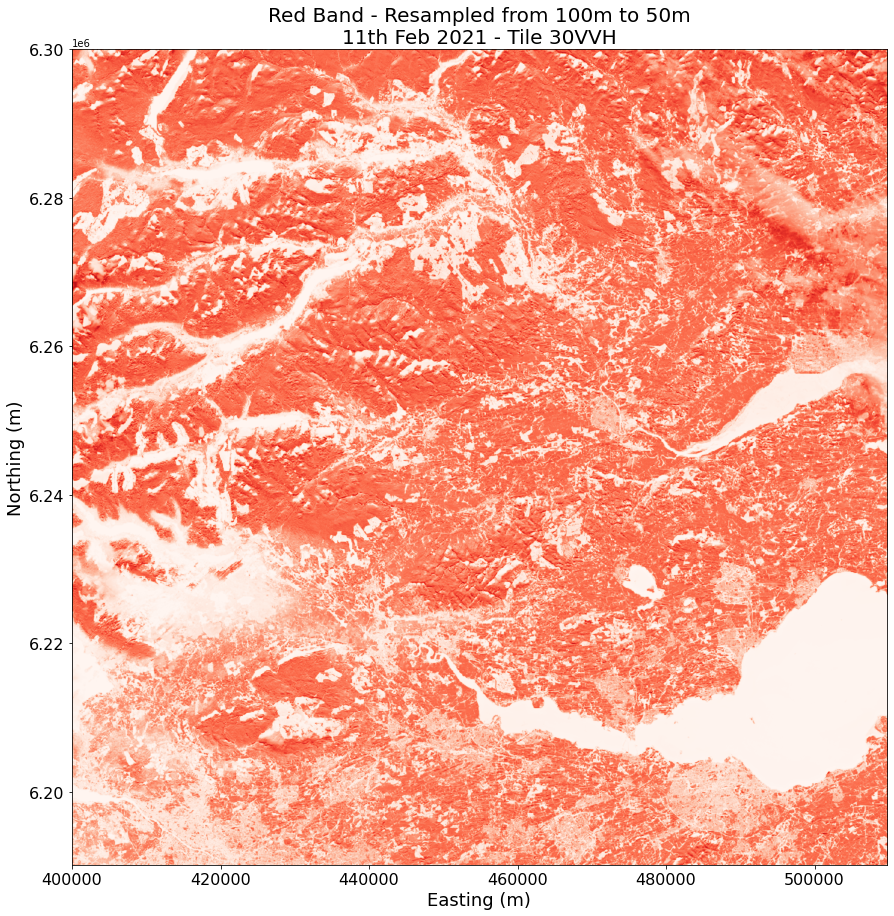

In [5]:
from rasterio.enums import Resampling

fig, ax = plt.subplots(figsize=(15, 15))

upscale_factor = 2

with rio.open(red_band_fn) as dataset:

    print(f'Before resampling, the spatial resolution is {dataset.res[0]} metres\n')
    
    # resample data to target shape
    data = dataset.read(
        out_shape=(
            dataset.count,
            int(dataset.height * upscale_factor),
            int(dataset.width * upscale_factor)
        ),
        resampling=Resampling.bilinear
    )

    # scale image transform
    transform = dataset.transform * dataset.transform.scale(
        (dataset.width / data.shape[-1]),
        (dataset.height / data.shape[-2])
    )

print(f'After resampling, the spatial resolution is {dataset.res[0] / upscale_factor} metres\n')
show(data, transform=transform, ax=ax, cmap='Reds')

ax.tick_params(axis='both', which='major', labelsize=16)
ax.set_xlabel('Easting (m)', fontsize=18)
ax.set_ylabel('Northing (m)', fontsize=18)
ax.set_title('Red Band - Resampled from 100m to 50m\n11th Feb 2021 - Tile 30VVH', fontsize=20)

plt.show()

## Load some other bands in the same way...

_Lets go back to working with bands at 100m resolution, for the sake of simplicity..._

Once we have loaded multiple bands, we can perform maths on them or analyse their differences

For instance, we may wish to create an RGB image to visualise the satellite scene.  

To do this we can extract bands 4 (R - red), 3 (G - green), and 2 (B - blue)
data and then create a stack of these 3 images to plot.  

Alternatively we can use other bands such as the Near Infrared band 8 to create False Colour composites,
by assigning any band we want to the Red, Green, and Blue channels of a standard image.

In [6]:
# Load some other bands

with rio.open(red_band_fn) as src:
    red = src.read(1)
    
with rio.open(blue_band_fn) as src:
    blue = src.read(1)

with rio.open(nir_band_fn) as src:
    nir = src.read(1)

## Plot a histogram of each band

One of the fundamental tools of image analysis is the histogram.  

We can easily plot histograms of different image bands using the `matplotlib.hist()` method, for example

Here we crete a plot to look at the differences between bands 2,3,4 and 8 of the example image.

This could be used, for example, to find differences between sppectral responses in different bands that could be used to separate different types of land

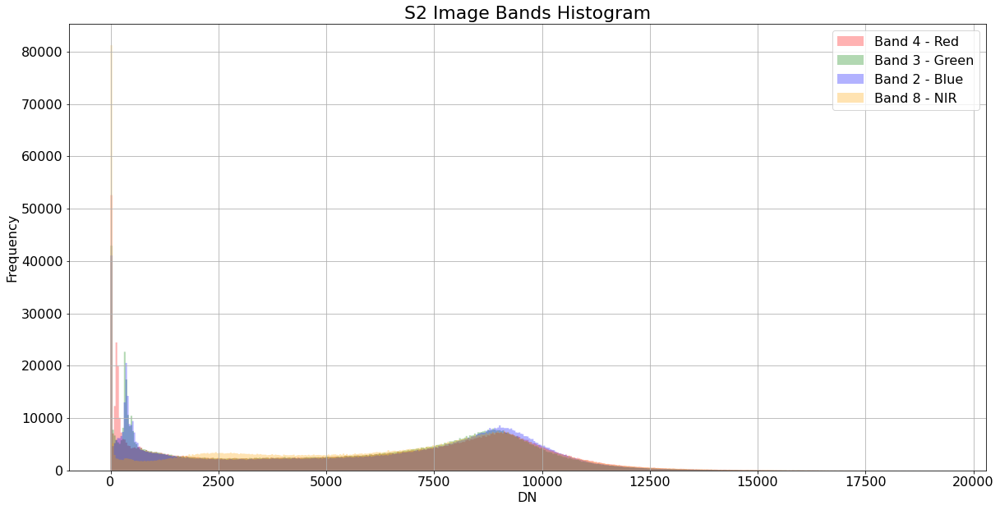

In [7]:
from matplotlib import pyplot as plt

fig, ax_histogram = plt.subplots(figsize=(20, 10))

ax_histogram.hist(red.ravel(), bins=500, histtype='stepfilled', lw=0.0, stacked=False, alpha=0.3, color='Red', label='Band 4 - Red')
ax_histogram.hist(green.ravel(), bins=500, histtype='stepfilled', lw=0.0, stacked=False, alpha=0.3, color='Green', label='Band 3 - Green')
ax_histogram.hist(blue.ravel(), bins=500, histtype='stepfilled', lw=0.0, stacked=False, alpha=0.3, color='Blue', label='Band 2 - Blue')
ax_histogram.hist(nir.ravel(), bins=500, histtype='stepfilled', lw=0.0, stacked=False, alpha=0.3, color='Orange', label='Band 8 - NIR')

ax_histogram.tick_params(axis='both', which='major', labelsize=16)
ax_histogram.set_xlabel('DN', fontsize=16)
ax_histogram.set_ylabel('Frequency', fontsize=16)
ax_histogram.set_title('S2 Image Bands Histogram', fontsize=22)

plt.legend(fontsize=16)
plt.grid()
plt.show()

## Add a function to help with plotting

This basic function prepares the satellite band data for nice plotting by normalising each band

It "clips" the data above and below `mean` plus/minus two standard deviations `std`

It then normalises the values so that they are between 0 and 1, since this is the range matplotlib likes for plotting

In [8]:
def prepare(arr):
    
    mn = arr.mean()
    sd = arr.std()
    upper = mn + (2*sd)
    lower = mn - (2*sd)
    
    arr[arr > upper] = upper
    arr[arr < lower] = lower
    
    return (arr * (1 / upper))

## Stack the prepared red, green, and blue bands into an "RGB stack" and plot them

"Prepared" here means stack the results of passing each band array to the `prepare()` function to normalise it for plotting nicely

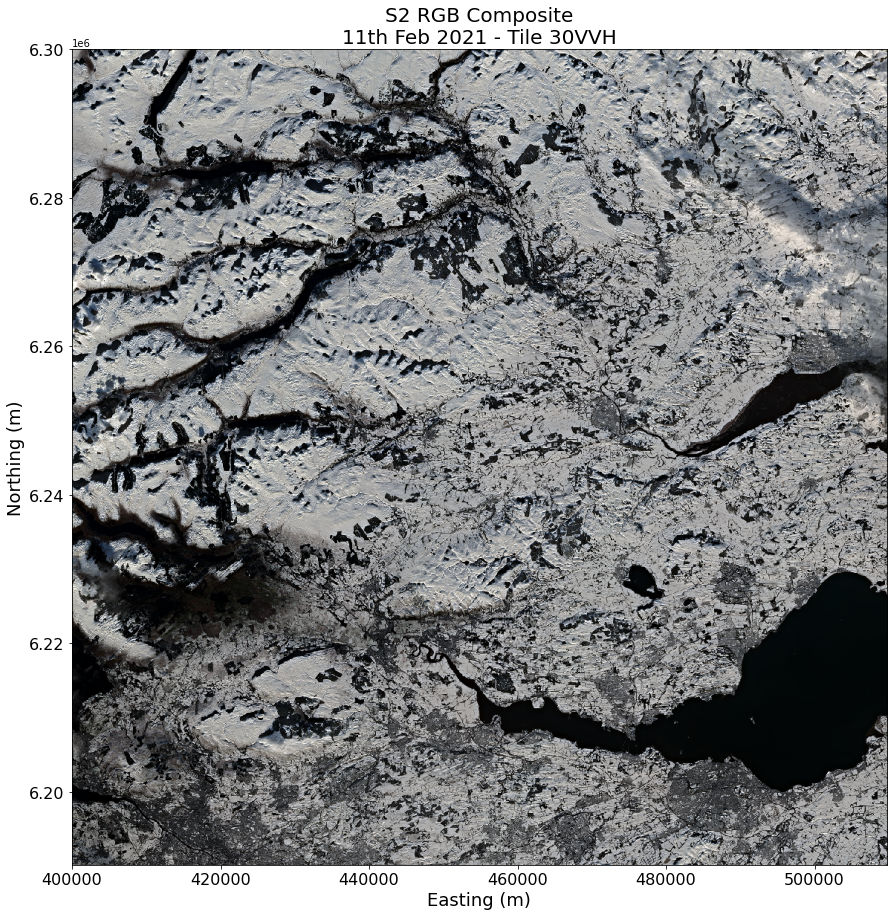

In [9]:
fig, ax_image = plt.subplots(figsize=(15, 15))

stack = np.stack([prepare(red), prepare(green), prepare(blue)])

show(stack, transform=profile['transform'], ax=ax_image)

ax_image.tick_params(axis='both', which='major', labelsize=16)

ax_image.set_xlabel('Easting (m)', fontsize=18)
ax_image.set_ylabel('Northing (m)', fontsize=18)

ax_image.set_title('S2 RGB Composite\n11th Feb 2021 - Tile 30VVH', fontsize=20)

plt.show()

## Calculate Vegetation Indices From Satellite Band Data

Vegetation indices are ways of combining different satellite bands to highlight aspects of the natural world.  One of the oldest and most important of these is the Normalised Difference Vegetation Index (NDVI).  This exploits the spectral response of vegetation in different wavelengths so produce an output that has high values over vegetation and low values over non-vegetated areas.

Once you have extracted satellite image band data as numpy arrays as above, you can manipulate this data as you would with any other data in numpy.

NDVI is calculated from the near-infrared band and the red band, exploiting the fact that, in general, vegetation has a high reflectance in the NIR and low reflectance in the red band.

See https://en.wikipedia.org/wiki/Normalized_difference_vegetation_index for more info

Notice that the bright yellow indicates high values of NDVI i.e. more densely vegetated areas, and dark blue areas are low NDVI such as water bodies

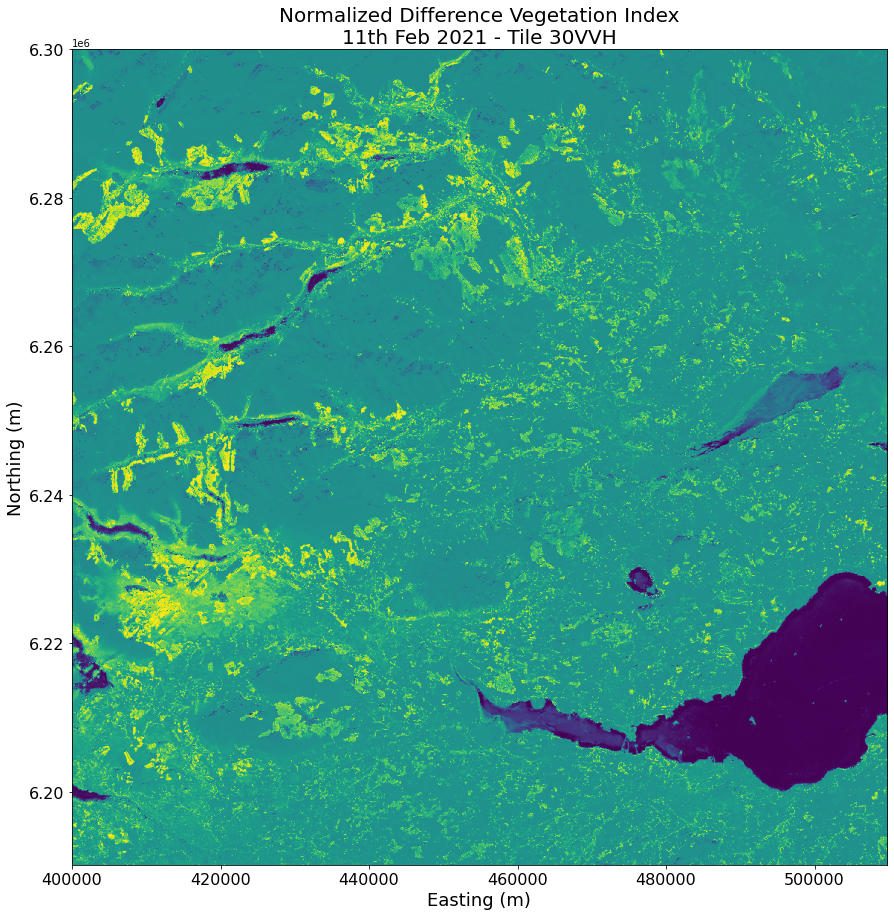

In [10]:
# A mask to cover occasional places where NDVI is not defined, 
# i.e. when NIR + Red = 0
mask = nir == -1*red

# Normlise Data
red = prepare(red)
nir = prepare(nir)

# Calculate NDVI - this throws up a warning where there are divide
# by zeros in the calculation, but we suppress the warning
np.seterr(divide='ignore', invalid='ignore')
ndvi = np.divide(np.subtract(nir, red), np.add(nir, red)).astype(np.float64)

# Apply the mask and say that we want to fill in the value of 0 where NDVI is not defined, for the purposes of plotting
ndvi = np.ma.masked_array(ndvi, mask = mask, fill_value=0).filled()

# Set up plot
fig, ax_ndvi = plt.subplots(figsize=(15, 15))

show(ndvi, transform=profile['transform'], ax=ax_ndvi)

ax_ndvi.tick_params(axis='both', which='major', labelsize=16)
ax_ndvi.set_xlabel('Easting (m)', fontsize=18)
ax_ndvi.set_ylabel('Northing (m)', fontsize=18)
ax_ndvi.set_title('Normalized Difference Vegetation Index\n11th Feb 2021 - Tile 30VVH', fontsize=20)

plt.show()

## Working with basic vector data using `geopandas`

We can visualise vector data as well as raster data.

`geopandas` is built on top of `pandas` and uses much the same syntax so is a good option for those already familiar with this way of working.

The vector data is this example is in `.gpkg` format (GeoPackage), but almost any vector format can be read in this way.

The data is stored and manipulated as a `GeoDataFrame` when loaded in this way 

**You will get a `UserWarning` in the cell below - do not worry about this for the purposes of this notebook**

**If you get this warning and want to get rid of it on your own laptop, you can try the steps outlined at https://www.codestudyblog.com/cs2112pyc/1221122348.html**

In [11]:
import geopandas as gpd

cities_fn = 'input/vector_polygons.gpkg'

cities = gpd.read_file(cities_fn)

print(cities)

print(f'\nThe coordinate reference system of cities is {cities.crs}')
print(f'The coordinate reference system of the satellite imagery is {profile["crs"]}')

if cities.crs != profile['crs']:
    print('\nThe CRSs are different so you will need to "reproject" one to the other')

        Name                                           geometry
0      Perth  POLYGON ((-387296.134 7642758.788, -385024.273...
1     Dundee  POLYGON ((-341583.763 7652858.748, -336677.625...
2  Edinburgh  POLYGON ((-354186.658 7556759.706, -367475.598...

The coordinate reference system of cities is epsg:3857
The coordinate reference system of the satellite imagery is EPSG:32630

The CRSs are different so you will need to "reproject" one to the other


## Be aware of CRS conflicts!

When mixing different geospatial datasets, you must make sure that the datasets are in the same CRS.

Otherwise the results may not be as you expect...

You can easily convert between CRSs - for example below, our polygons are not in the same CRS as the satellite imagery, so we use the `GeoDataFrame.to_crs()` method to convert

In [12]:
# Convert polygon CRS to satellite image CRS
cities = cities.to_crs(profile['crs'])

# Check that the two datasets do indeed now have the same CRS
print(cities.crs == profile['crs'])


True


## Add an "attribute" to the GeoDataFrame

With `geopandas`, we can calculate and add new "attributes" to the GeoDataFrame

Each row of the GDF is a separate polygon, with it's own properties.

In this example, we add a new column representing the area (in square kilometres) of each city outline

In [13]:
cities['Area_km2'] = cities.area / 1_000_000  # By default, areas are calculated using the units of the CRS, in this case m2.  Divide by 1_000_000 to get km2

print(cities[['Name', 'Area_km2']].round(1))

        Name  Area_km2
0      Perth      18.0
1     Dundee      60.4
2  Edinburgh     128.7


## Plot our satellite image RGB composite again with polygons of city outlines overlaid

Of course this is useful for plotting but it can also be used to extract the data from an image band or stack of bands within a polygon, for example.

In that way, we could find extract the pixels for "Edinburgh" and analyse them separately.

This tutorial does not include examples of that step, but it can be achieved using `rasterio` and `geopandas`, and also other packages like `rasterstats`

The process of extracting the statistics from a raster within the areas defined by certain polygons is called "zonal statistics".

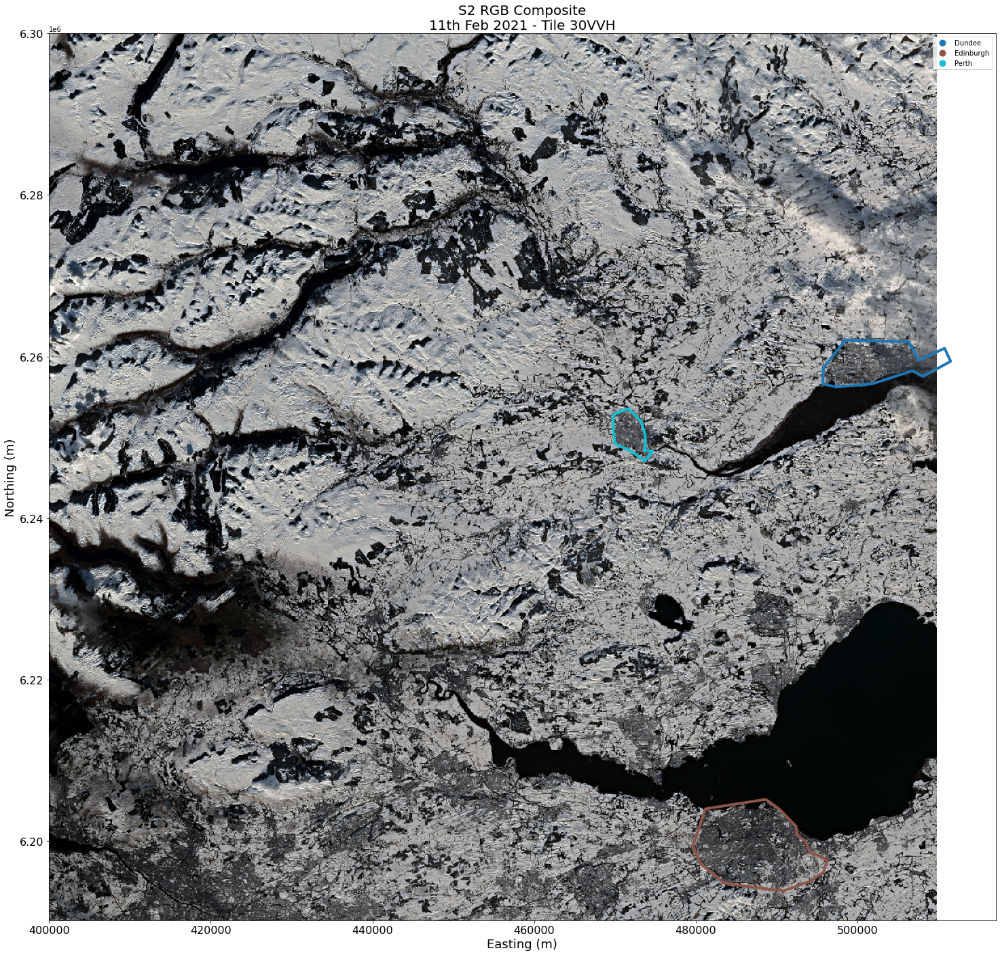

In [14]:
fig, ax_image = plt.subplots(figsize=(25, 25))

stack = np.stack([prepare(red), prepare(green), prepare(blue)])

show(stack, transform=profile['transform'], ax=ax_image)

cities.plot(ax=ax_image, column="Name", lw=4, facecolor="none", legend=True)

ax_image.tick_params(axis='both', which='major', labelsize=16)

ax_image.set_xlabel('Easting (m)', fontsize=18)
ax_image.set_ylabel('Northing (m)', fontsize=18)

ax_image.set_title('S2 RGB Composite\n11th Feb 2021 - Tile 30VVH', fontsize=20)

plt.show()

## Extract Pixels Within Polygons - Zonal Statistics

Very often in remote sensing / earth observation, we have one or more areas of interest (AOIs) defined by vector polygons, plus a lot of satellite data, and we wish to analyse the values of multiple bands of data within each of the polygons.  This allows us to extract information about each AOI, compare them, and use the data to prepare for machine learning or similar endeavours, since we often have labels or other data also associated with each polygon, such as whether it represents a wind-damaged area after a storm, or not.

In [15]:
from rasterstats import zonal_stats

# Extract statistics from the array of green band data, using the cities GDF for the areas of interest.
# Here we extract mean, min, max and std stats but others are available - check the rasterstats documentation
# The `geojson_out=True` means that the output is a dictionary and inlucdes the geometry of the input cities GDF.
# This means we can recreate another GDF from `statistics` which then includes the statistical information as attributes.
statistics = zonal_stats(cities, green, affine=profile['transform'], nodata=-9999, stats='mean min max std', geojson_out=True)

cities_with_statistics = gpd.GeoDataFrame.from_features(statistics, crs=cities.crs)

# The stats columns have generic names by default - here we rename to something more meaningful
cities_with_statistics.rename(columns={
    'mean': 'Green_avg',
    'min' : 'Green_min',
    'max' : 'Green_max',
    'std' : 'Green_std',
}, inplace=True)

print(cities_with_statistics)

                                            geometry    Area_km2       Name  \
0  POLYGON ((470443.141 6253080.876, 471705.177 6...   17.992489      Perth   
1  POLYGON ((495780.017 6258561.718, 498496.400 6...   60.378671     Dundee   
2  POLYGON ((488664.538 6205168.578, 481212.515 6...  128.727230  Edinburgh   

   Green_min  Green_max    Green_avg     Green_std  
0        0.0    13071.0  4664.574681   2295.185380  
1        0.0    55537.0  6849.145816  11075.594957  
2        0.0    13071.0  4173.781748   2632.209343  


# Extract Pixels Within Polygons - Get Coordinates

Since there are a certain set of raster pixels that fall within a given polygon, we may wish to extract the coordinates of the centre points (centroids) of these pixels so that we can use these coordinates to extract raster pixel values for another stack of rasters or satellite bands.

The procedure below demonstrates a way of doing this, by making use of the ability of the `rasterstats` package to output miniature arrays of the pixels within a set of polygons, plus the `Affine` transform object, which is the tool for converting between pixel coordinates (i.e. row 20, column 129) to projected coordinates (i.e. northings and eastings or latitudes and longitudes, depending on the units of the CRS).

When we get a `mini_raster_array` as a `numpy.MaskedArray()`, we can use the `Affine` to get the projected coordinates of all of the points in the bounding box, and then use the `mask` from the masked array to filter only those pixels that are not masked out i.e. those that lie within the actual polygon, not just within the bounding box.

For a better explanation and to visualise the above bit about mini rasters arrays, see the `rasterstats` documentation at https://pythonhosted.org/rasterstats/manual.html#zonal-statistics

In [16]:
# For this example, lets just select a single polygon - the one for Edinburgh

edinburgh = cities.loc[cities.Name == 'Edinburgh']


# Then we'll run zonal_stats on edinburgh, with raster_out=True to give
# us the mini raster array for the polygon, plus the Affine transform
# Note that even though we are using only 1 polygon, the zonal_stats 
# still returns a list of 1 element, so we take the first element using [0]

result = zonal_stats(edinburgh, green, affine=profile['transform'], nodata=-9999, stats='mean', raster_out=True)[0]

### Next, we build an array of pixel coordinates using `np.meshgrid` before using the `affine` transform to convert these to real-world coordinates

In [17]:
# Shapely is a very useful geospatial library for building vector data from scratch
# We import a Point class so we can create Point objects reprsenting a single point on the Earth's surface
from shapely.geometry import Point

# Get the array and affine transform from the above result, to make things more readable
arr = result['mini_raster_array']
affine = result['mini_raster_affine']

# Extract height and width of the pixel array within the polygon bounding box
height = arr.shape[0]
width = arr.shape[1]

print(f'The pixel array that covers the Edinburgh polygon is an array with height {height} and width {width}\n')

# Use a meshgrid to get arrays of column and row numbers for each cell in the array
cols, rows = np.meshgrid(np.arange(width), np.arange(height))

# Use rasterio along with the rows and columns to get real-world coordinates
xs, ys = rio.transform.xy(affine, rows, cols)

# Convert the lists from above into arrays so we can filter using the mask
eastings = np.array(xs)
northings = np.array(ys)

# Here, "good" coordinates are those which are actually within the polygon itself
# We get these by filtering the rectangular array with the array's mask
good_eastings = list(eastings[arr.mask == False])
good_northings = list(northings[arr.mask == False])

# Finally, we can create a new GeoDataFrame with the geometry column created from a list of shapely Point objects, which in turn are
# created from pairs of eastings and northings.
pixel_centres_in_polygon = gpd.GeoDataFrame(geometry=[Point(easting, northing) for easting, northing in zip(good_eastings, good_northings)])

#The resulting GeoDataFrame is basic - it doesn't have any attributes, but we can add whatever attributes we want using normal geopandas / pandas syntax
print(pixel_centres_in_polygon)

The pixel array that covers the Edinburgh polygon is an array with height 114 and width 168

                             geometry
0      POINT (488610.000 6205150.000)
1      POINT (487910.000 6205050.000)
2      POINT (488010.000 6205050.000)
3      POINT (488110.000 6205050.000)
4      POINT (488210.000 6205050.000)
...                               ...
12870  POINT (490710.000 6193950.000)
12871  POINT (490810.000 6193950.000)
12872  POINT (490910.000 6193950.000)
12873  POINT (491010.000 6193950.000)
12874  POINT (491110.000 6193950.000)

[12875 rows x 1 columns]


## Write a GeoDataFrame to File

In [18]:
# The syntax to use for writing out a file is as follows:

# gdf.to_file('path/to/output_file.gpkg', driver='GPKG')

# Where gdf is a GeoDataFrame such as the set of points we extracted above.
# the driver can be one of many different formats, but GPKG is a standard and works well.

## Display the Pixels for Edinburgh and the Centre Points We've Extracted

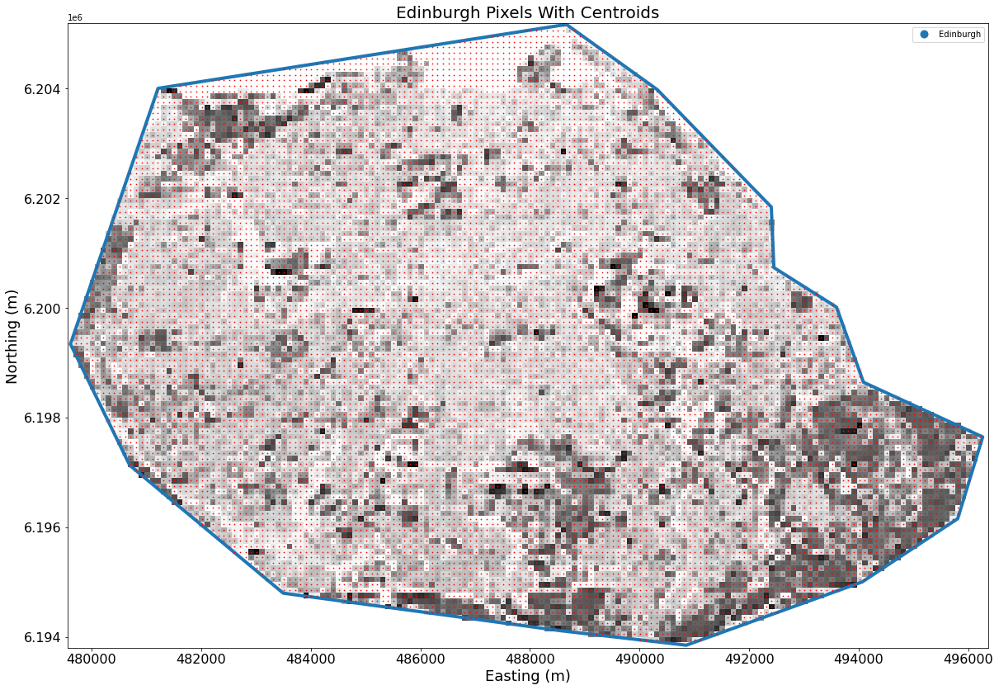

In [19]:
fig, ax_edinburgh = plt.subplots(figsize=(20, 20))

stack = np.stack([prepare(red), prepare(green), prepare(blue)])

show(arr, transform=affine, ax=ax_edinburgh, cmap='Greys')

edinburgh.plot(ax=ax_edinburgh, column="Name", lw=4, facecolor="none", legend=True)
pixel_centres_in_polygon.plot(ax=ax_edinburgh, marker='o', markersize=0.5, color='Red')

ax_edinburgh.tick_params(axis='both', which='major', labelsize=16)

ax_edinburgh.set_xlabel('Easting (m)', fontsize=18)
ax_edinburgh.set_ylabel('Northing (m)', fontsize=18)

ax_edinburgh.set_title('Edinburgh Pixels With Centroids', fontsize=20)

plt.show()

## Extract raster band values at each point in our GeoDataFrame

Lets say we have extracted a load of points such as above and have them stored in a GeoDataFrame.  Now we want to loop through a load of different satellite image bands and get the values of each pixel at the location of each point.

We can do this as in the example below, which uses the abilities of `rasterio.sample` to extract (sample) the pixel values and add them to the GeoDataFrame for later analysis

This is just an example to show the idea with a single polygon - in reality you would more likely be working with a large number of polygons, each with a unique ID and other attributes

In [20]:
# Create a copy of the pixel centre coords GDF, to leave that untouched.
edinburgh_data = pixel_centres_in_polygon.copy()

# Loop through the various bands that we wish to analyse, and extract pixel values for each
for band_name, band_file in [('Red', red_band_fn), ('Green', green_band_fn), ('Blue', blue_band_fn), ('NIR', nir_band_fn)]:
    with rio.open(band_file) as src:
        edinburgh_data[f'{band_name}'] = [val[0] for val in src.sample(zip(pixel_centres_in_polygon.geometry.x, pixel_centres_in_polygon.geometry.y))]

print(edinburgh_data)

                             geometry    Red  Green   Blue    NIR
0      POINT (488610.000 6205150.000)    975    984    994   1590
1      POINT (487910.000 6205050.000)    305    290    239     15
2      POINT (488010.000 6205050.000)    266    285    232      4
3      POINT (488110.000 6205050.000)    231    259    225      0
4      POINT (488210.000 6205050.000)    246    272    218      2
...                               ...    ...    ...    ...    ...
12870  POINT (490710.000 6193950.000)  11078  10809  11070  11002
12871  POINT (490810.000 6193950.000)   9631   9474   9732   9512
12872  POINT (490910.000 6193950.000)   7015   6936   7293   6731
12873  POINT (491010.000 6193950.000)   2153   2164   2286   2390
12874  POINT (491110.000 6193950.000)    623    489    357   1037

[12875 rows x 5 columns]
